In [1]:
import numpy as np
from derive_conceptualspace.load_data.load_semanticspaces import get_all, display_svm
from derive_conceptualspace.util.base_changer import ThreeDPlane
from derive_conceptualspace.util.threedfigure import ThreeDFigure, make_meshgrid
argmax = lambda l: max(enumerate(l), key=lambda x:x[1])[0]

## First with the original DESC15 ones

In [2]:
data_base, data_set, n_dims = "/home/chris/Documents/UNI_neu/Masterarbeit/data_new/semanticspaces/", "places", 20
canditerms, cluster_directions, mds_class_dict = get_all(data_base, data_set, n_dims)
print("Cluster Centers:", set([i[2] for i in canditerms]))

Will use `Geonames` as type. Alternatives are: Foursquare, Geonames, CYC.
Cluster Centers: {'background', 'field', 'iowa', 'slipway', 'buy', 'athlete', 'marine', 'treno', 'morze', 'realestate', 'factory', 'farmhouse', 'sign', 'monument', 'b737', 'engine', 'baby', 'building', 'seafood', '13thcentury', 'education', 'nature', 'tunnel', 'skyscrapers', 'hot', 'vintage', 'wings', 'people', 'ceiling', 'travel', 'lounge', 'crane', 'road', 'military', 'horror', 'wait', 'technology', 'ruin', 'national', 'shadows'}


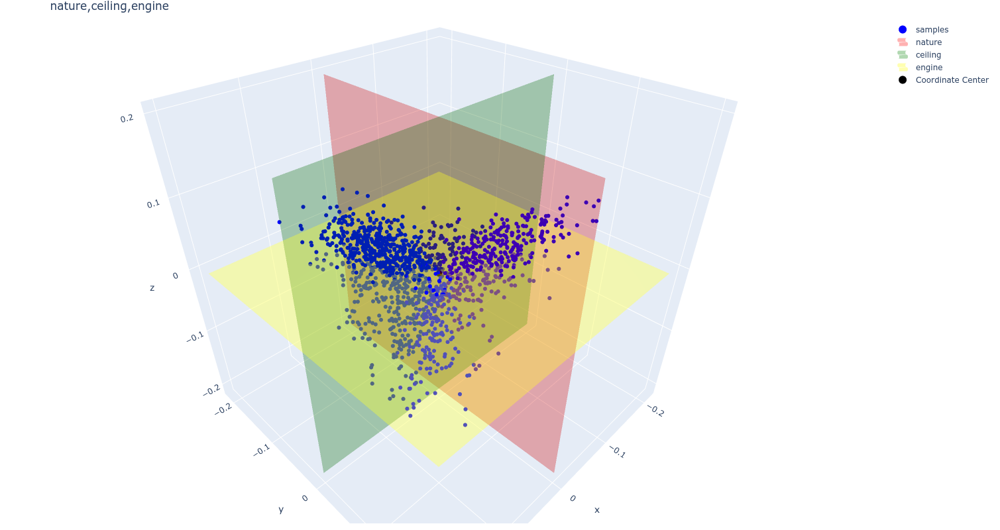

In [3]:
three_dims = list(cluster_directions.keys())[:3]
entities = {k: (v[1], np.array([v[2][k2] for k2 in three_dims])) for k, v in mds_class_dict.items()}
display_svm(entities, {k: cluster_directions[k] for k in three_dims})

## Now mine. Get the most 3 important dimensions from the Decision Tree and then display, colored by labelclass

In [4]:
import matplotlib.pyplot as plt
import pandas as pd
from IPython.display import HTML
import pyperclip

from misc_util.logutils import setup_logging
from misc_util.pretty_print import Markdown, display

from derive_conceptualspace.pipeline import SnakeContext, load_envfiles, cluster_loader
from derive_conceptualspace.util.result_analysis_tools import getfiles_allconfigs, display_metrics, show_lambda_elements, highlight_nonzero_max
from derive_conceptualspace.settings import DEFAULT_N_CPUS
from derive_conceptualspace.util.threadworker import WorkerPool
from derive_conceptualspace.cli.args_from_filename import get_filename, print_envvars
from derive_conceptualspace.util.desc_object import DescriptionList
from derive_conceptualspace.evaluate.shallow_trees import classify_shallowtree
from derive_conceptualspace.evaluate.shallow_trees import CATNAMES

plt.rcParams['figure.figsize'] = [16, 10]

In [5]:
setup_logging()
load_envfiles("placetypes")
configs, print_cnf = getfiles_allconfigs("clusters", verbose=False, parse_all=True)

In [6]:
loaders = dict(clusters=cluster_loader, embedding=lambda **args: args["embedding"].embedding_, pp_descriptions=DescriptionList.from_json)
clusters, embedding, descriptions = SnakeContext.loader_context(config=configs[0]).load("clusters", "embedding", "pp_descriptions", loaders=loaders)

<span style="font-size:11pt">env_vars demanded config EMBED_DIMENSIONS to be <span style="color: #ff0000">200</span>, but force overwrites it to <span style="color: #0000ff">50</span></span>

<span style="font-size:11pt">env_vars demanded config CLASSIFIER_SUCCMETRIC to be <span style="color: #ff0000">kappa_digitized_onlypos_2</span>, but force overwrites it to <span style="color: #0000ff">kappa_rank2rank_onlypos_max</span></span>

<span style="font-size:11pt">Running with the following settings [<span style="color: #00ff00">a3e25b6709</span>]: ALL_DESCRIPTIONS_LANG: <span style="color: #ff0000">en</span>, CANDIDATE_MIN_TERM_COUNT: <span style="color: #ff0000">50</span>, CANDS_USE_NDOCS_COUNT: <span style="color: #0000ff">True</span>, CLASSIFIER: <span style="color: #0000ff">SVM</span>, CLASSIFIER_SUCCMETRIC: <span style="color: #0000ff">kappa_rank2rank_onlypos_max</span>, CLUSTER_DIRECTION_ALGO: <span style="color: #0000ff">reclassify</span>, DATASET: <span style="color: #ff0000">placetypes</span>, DCM_QUANT_MEASURE: <span style="color: #0000ff">count</span>, DEBUG: <span style="color: #0000ff">False</span>, DISSIM_MAT_ONLY_PARTNERED: <span style="color: #0000ff">True</span>, DISSIM_MEASURE: <span style="color: #0000ff">norm_ang_dist</span>, EMBED_ALGO: <span style="color: #0000ff">mds</span>, EMBED_DIMENSIONS: <span style="color: #ff0000">50</span>, EXTRACTION_METHOD: <span style="color: #ff0000">all</span>, KAPPA_WEIGHTS: <span style="color: #0000ff">quadratic</span>, LANGUAGE: <span style="color: #ff0000">en</span>, MAX_NGRAM: <span style="color: #ff0000">None</span>, MIN_WORDS_PER_DESC: <span style="color: #0000ff">50</span>, MOST_DISTINCT_PERCENT: <span style="color: #0000ff">30</span>, NDIMS_NCANDS_FACTOR: <span style="color: #0000ff">2</span>, NGRAMS_IN_EMBEDDING: <span style="color: #0000ff">False</span>, PP_COMPONENTS: <span style="color: #ff0000">none</span>, PREPROCESSED_BOW: <span style="color: #ff0000">True</span>, PRIM_LAMBDA: <span style="color: #0000ff">0.5</span>, QUANTIFICATION_MEASURE: <span style="color: #ff0000">ppmi</span>, RANDOM_SEED: <span style="color: #ff0000">None</span>, SEC_LAMBDA: <span style="color: #0000ff">0.1</span>, TRANSLATE_POLICY: <span style="color: #0000ff">onlyorig</span></span>

In [7]:
res = classify_shallowtree(clusters, embedding, descriptions, one_vs_rest=False, dt_depth=None, test_percentage_crossval=0, classes="Geonames", do_plot=False, verbose=True, return_features=False)
assert res == 1

<span style="font-size:11pt">Highest-ranking descriptions per dimension:<br>    isawyoufirst           : beach<br>    workspace              : office<br>    nutrition              : restaurant<br>    goalie                 : stadium<br>    pumper                 : building<br>    starwoodhotels         : hotel room<br>    interstate10           : highway<br>    urban                  : interior<br>    tuolumne               : creek<br>    cabs                   : downtown<br>    investment             : school<br>    stripmall              : downtown<br>    michiganstateuniversity: school<br>    ews                    : railroad<br>    anchored               : boat<br>    a10                    : airport<br>    wc2                    : restaurant<br>    airbase                : airport<br>    joshuatreenationalpark : canyon<br>    clinker                : building</span>

<span style="font-size:11pt">Using classes from Geonames - 403/1383 entities have a class</span>

<span style="font-size:11pt">Labels: spot,building,farm: 176, stream,lake: 74, road,railroad: 16, parks,area: 28, undersea: 27, mountain,hill,rock: 68, forest,heath: 14</span>

<span style="font-size:11pt">Eval-Settings: type: <span style="color: #0000ff">all-at-once</span>, DT-Depth: <span style="color: #0000ff">None</span>, train-test-split:<span style="color: #0000ff"> 0.0% in test-set </span></span>

derive_conceptualspace/evaluate/shallow_trees.py:100: UserWarning: Using the full data as training set without a test-set!


<span style="font-size:11pt">Accuracy: 1.00</span>

In [8]:
clfs, inputs, targets, scores = classify_shallowtree(clusters, embedding, descriptions, one_vs_rest=True, dt_depth=3, test_percentage_crossval=0, classes="Geonames", do_plot=False, verbose=False, return_features=True)

<span style="font-size:11pt">Using classes from Geonames - 403/1383 entities have a class</span>

<span style="font-size:11pt">Labels: spot,building,farm: 176, stream,lake: 74, road,railroad: 16, parks,area: 28, undersea: 27, mountain,hill,rock: 68, forest,heath: 14</span>

<span style="font-size:11pt">Eval-Settings: type: <span style="color: #0000ff">one-vs-rest</span>, DT-Depth: <span style="color: #0000ff">3</span>, train-test-split:<span style="color: #0000ff"> 0.0% in test-set </span></span>

derive_conceptualspace/evaluate/shallow_trees.py:100: UserWarning: Using the full data as training set without a test-set!
derive_conceptualspace/evaluate/shallow_trees.py:100: UserWarning: Using the full data as training set without a test-set!
derive_conceptualspace/evaluate/shallow_trees.py:100: UserWarning: Using the full data as training set without a test-set!
derive_conceptualspace/evaluate/shallow_trees.py:100: UserWarning: Using the full data as training set without a test-set!
derive_conceptualspace/evaluate/shallow_trees.py:100: UserWarning: Using the full data as training set without a test-set!
derive_conceptualspace/evaluate/shallow_trees.py:100: UserWarning: Using the full data as training set without a test-set!
derive_conceptualspace/evaluate/shallow_trees.py:100: UserWarning: Using the full data as training set without a test-set!


<span style="font-size:11pt">Per-Class-Scores: spot,building,farm: 0.78, stream,lake: 0.84, undersea: 0.65, forest,heath: 0.89, road,railroad: 0.85, parks,area: 0.76, mountain,hill,rock: 0.76</span>

<span style="font-size:11pt">Unweighted Mean Accuracy: 0.79</span>

<span style="font-size:11pt">Weighted Mean Accuracy: 0.78</span>

### Get most important features

now I want to get the most important features ==> find the nonzero elements from clf.feature_importances_ (and their dimension-name) 
but also the actual tree-decision as you see when plotting it with graphviz -> maybe https://scikit-learn.org/stable/auto_examples/tree/plot_unveil_tree_structure.html#sphx-glr-auto-examples-tree-plot-unveil-tree-structure-py ?

In [9]:
def get_decision_path(X_test, clf, catnames, axnames):
    n_nodes = clf.tree_.node_count
    children_left = clf.tree_.children_left
    children_right = clf.tree_.children_right
    classes = [catnames[clf.classes_[np.argmax(i)]] for i in clf.tree_.value]
    node_depth = np.zeros(shape=n_nodes, dtype=np.int64)
    is_leaves = np.zeros(shape=n_nodes, dtype=bool)
    stack = [(0, 0)]  # start with the root node id (0) and its depth (0)
    while len(stack) > 0:
        # `pop` ensures each node is only visited once
        node_id, depth = stack.pop()
        node_depth[node_id] = depth
        # If the left and right child of a node is not the same we have a split node
        is_split_node = children_left[node_id] != children_right[node_id]
        # If a split node, append left and right children and depth to `stack` so we can loop through them
        if is_split_node:
            stack.append((children_left[node_id], depth + 1))
            stack.append((children_right[node_id], depth + 1))
        else:
            is_leaves[node_id] = True
    print("The binary tree structure has {n} nodes and has the following tree structure:\n".format(n=n_nodes))
    for i in range(n_nodes):
        if is_leaves[i]:
            print("{space}node={node} is a leaf node - category {cat}".format(space=node_depth[i] * "\t", node=i, cat=classes[i]))
        else:
            print("{space}node={node} is a split node: go to node {left} if {feature} <= {threshold} else to node {right}. Cat={cat}".format(
                    space=node_depth[i] * "\t", node=i, left=children_left[i], feature=axnames[clf.tree_.feature[i]], threshold=clf.tree_.threshold[i], right=children_right[i], cat=classes[i]))

In [10]:
axnames = [f",".join([i]+clusters["clusters"][i][:2]) for i in inputs.columns]
for catnames, clf in clfs:
    get_decision_path(inputs, clf, catnames, axnames)
    print("Feature Importances:\n", {elem: axnames[i] for i, elem in enumerate(clf.feature_importances_) if elem > 0})
    print("=="*50+"\n"+"=="*50)

The binary tree structure has 15 nodes and has the following tree structure:

node=0 is a split node: go to node 1 if pumper,facility,apparatus <= 94.5 else to node 8. Cat=other
	node=1 is a split node: go to node 2 if calming,seawater,nd400 <= 25.5 else to node 5. Cat=other
		node=2 is a split node: go to node 3 if clinker,huizen,flanders <= 9.0 else to node 4. Cat=spot,building,farm
			node=3 is a leaf node - category other
			node=4 is a leaf node - category spot,building,farm
		node=5 is a split node: go to node 6 if manufacture,smokestacks,usine <= 198.0 else to node 7. Cat=other
			node=6 is a leaf node - category other
			node=7 is a leaf node - category spot,building,farm
	node=8 is a split node: go to node 9 if calming,seawater,nd400 <= 291.5 else to node 12. Cat=spot,building,farm
		node=9 is a split node: go to node 10 if clinker,huizen,flanders <= 283.5 else to node 11. Cat=spot,building,farm
			node=10 is a leaf node - category spot,building,farm
			node=11 is a leaf node 

#### Use feature_importance

In [11]:
axnames = [f",".join([i]+clusters["clusters"][i][:2]) for i in inputs.columns]
for catnames, clf in clfs:
    feats = [(i[0], round(i[1],3)) for i in sorted({axnames[i]: elem for i, elem in enumerate(clf.feature_importances_) if elem > 0}.items(), key=lambda x:x[1], reverse=True)][:3]
    print(catnames[1].ljust(max(len(i[0][1]) for i in clfs)), feats)

spot,building,farm [('calming,seawater,nd400', 0.403), ('pumper,facility,apparatus', 0.307), ('clinker,huizen,flanders', 0.12)]
stream,lake        [('raum,renovations,interieur', 0.327), ('dory,marine,beaches', 0.183), ('stripmall,retail,awning', 0.17)]
undersea           [('hydropower,weir,hydroelectric', 0.39), ('ruraldecay,ruins,ruin', 0.314), ('gymnasium,alumni,pregame', 0.148)]
forest,heath       [('pumper,facility,apparatus', 0.407), ('vitrine,tienda,souk', 0.267), ('tuolumne,yosemite,flume', 0.185)]
road,railroad      [('honfleur,lifeboat,pesce', 0.306), ('traintrack,smokestack,narrowgauge', 0.268), ('porttownsend,coastguard,montereybay', 0.175)]
parks,area         [('honfleur,lifeboat,pesce', 0.237), ('usn,pensacola,navy', 0.209), ('corbett,mating,gorges', 0.173)]
mountain,hill,rock [('mtbaker,northcascades,bluffs', 0.498), ('clinker,huizen,flanders', 0.191), ('snowboarding,alps,mt', 0.11)]


#### Use early decisions

In [12]:
def get_decisions(X_test, clf, catnames, axnames):
    n_nodes = clf.tree_.node_count
    children_left = clf.tree_.children_left
    children_right = clf.tree_.children_right
    classes = [catnames[clf.classes_[np.argmax(i)]] for i in clf.tree_.value]
    node_depth = np.zeros(shape=n_nodes, dtype=np.int64)
    is_leaves = np.zeros(shape=n_nodes, dtype=bool)
    stack = [(0, 0)]  # start with the root node id (0) and its depth (0)
    while len(stack) > 0:
        # `pop` ensures each node is only visited once
        node_id, depth = stack.pop()
        node_depth[node_id] = depth
        # If the left and right child of a node is not the same we have a split node
        is_split_node = children_left[node_id] != children_right[node_id]
        # If a split node, append left and right children and depth to `stack` so we can loop through them
        if is_split_node:
            stack.append((children_left[node_id], depth + 1))
            stack.append((children_right[node_id], depth + 1))
        else:
            is_leaves[node_id] = True
    alls = {}
    for i in range(n_nodes):
        if not is_leaves[i]:
            alls.setdefault(node_depth[i], []).append((axnames[clf.tree_.feature[i]], clf.tree_.threshold[i]))  
    return (alls[0]+alls[1]) if len(alls) > 1 else alls[0]

In [13]:
axnames = [f",".join([i]+clusters["clusters"][i][:2]) for i in inputs.columns]
for catnames, clf in clfs:
    print(catnames[1].ljust(max(len(i[0][1]) for i in clfs)), get_decisions(inputs, clf, catnames, axnames))

spot,building,farm [('pumper,facility,apparatus', 94.5), ('calming,seawater,nd400', 25.5), ('calming,seawater,nd400', 291.5)]
stream,lake        [('raum,renovations,interieur', 220.5), ('tributary,ponte,pont', 307.0), ('dory,marine,beaches', 344.5)]
undersea           [('hydropower,weir,hydroelectric', 259.5), ('ruraldecay,ruins,ruin', 75.5), ('airbase,jetliner,airplanes', 116.5)]
forest,heath       [('pumper,facility,apparatus', 188.5), ('vitrine,tienda,souk', 88.5), ('tuolumne,yosemite,flume', 401.5)]
road,railroad      [('traintrack,smokestack,narrowgauge', 272.5), ('honfleur,lifeboat,pesce', 9.5), ('porttownsend,coastguard,montereybay', 352.5)]
parks,area         [('corbett,mating,gorges', 341.5), ('honfleur,lifeboat,pesce', 91.5), ('cama,bedroom,espejo', 359.5)]
mountain,hill,rock [('mtbaker,northcascades,bluffs', 98.5), ('jug,potato,kitchen', 302.0), ('clinker,huizen,flanders', 185.5)]


## let's plot!

In [14]:
clfs, inputs, targets, scores = classify_shallowtree(clusters, embedding, descriptions, one_vs_rest=True, dt_depth=2, test_percentage_crossval=0, classes="Geonames", do_plot=False, verbose=False, return_features=True)
axnames = [f",".join([i]+clusters["clusters"][i][:2]) for i in inputs.columns]

best_split = argmax(scores)
catnames, clf = clfs[best_split]
print(f"Best category to split: {catnames[1]} with score {max(scores):.3f}")
targets = targets[best_split]
important_feats = [i[0] for i in sorted({axnames[i]: elem for i, elem in enumerate(clf.feature_importances_) if elem > 0}.items(), key=lambda x:x[1], reverse=True)][:3]
early_splits = [i[0] for i in get_decisions(inputs, clf, catnames, axnames)]
print(important_feats)
print(early_splits)

<span style="font-size:11pt">Using classes from Geonames - 403/1383 entities have a class</span>

<span style="font-size:11pt">Labels: spot,building,farm: 176, stream,lake: 74, road,railroad: 16, parks,area: 28, undersea: 27, mountain,hill,rock: 68, forest,heath: 14</span>

<span style="font-size:11pt">Eval-Settings: type: <span style="color: #0000ff">one-vs-rest</span>, DT-Depth: <span style="color: #0000ff">2</span>, train-test-split:<span style="color: #0000ff"> 0.0% in test-set </span></span>

derive_conceptualspace/evaluate/shallow_trees.py:100: UserWarning: Using the full data as training set without a test-set!
derive_conceptualspace/evaluate/shallow_trees.py:100: UserWarning: Using the full data as training set without a test-set!
derive_conceptualspace/evaluate/shallow_trees.py:100: UserWarning: Using the full data as training set without a test-set!
derive_conceptualspace/evaluate/shallow_trees.py:100: UserWarning: Using the full data as training set without a test-set!
derive_conceptualspace/evaluate/shallow_trees.py:100: UserWarning: Using the full data as training set without a test-set!
derive_conceptualspace/evaluate/shallow_trees.py:100: UserWarning: Using the full data as training set without a test-set!
derive_conceptualspace/evaluate/shallow_trees.py:100: UserWarning: Using the full data as training set without a test-set!


<span style="font-size:11pt">Per-Class-Scores: spot,building,farm: 0.75, stream,lake: 0.52, undersea: 0.56, forest,heath: 0.73, road,railroad: 0.80, parks,area: 0.71, mountain,hill,rock: 0.73</span>

<span style="font-size:11pt">Unweighted Mean Accuracy: 0.68</span>

<span style="font-size:11pt">Weighted Mean Accuracy: 0.69</span>

Best category to split: road,railroad with score 0.797
['honfleur,lifeboat,pesce', 'traintrack,smokestack,narrowgauge', 'porttownsend,coastguard,montereybay']
['traintrack,smokestack,narrowgauge', 'honfleur,lifeboat,pesce', 'porttownsend,coastguard,montereybay']


In [15]:
inputcols = inputs.columns
inputs = inputs[[i[0].split(",")[0] for i in get_decisions(inputs, clf, catnames, axnames)]]

In [16]:
pos_inpt = inputs.iloc[np.where(targets)]
pos_custom_data = [{"Name": list(pos_inpt.index)[i]} for i in range(len(pos_inpt))]
neg_inpt = inputs.iloc[np.where(1-targets)]
neg_custom_data = [{"Name": list(neg_inpt.index)[i]} for i in range(len(neg_inpt))]

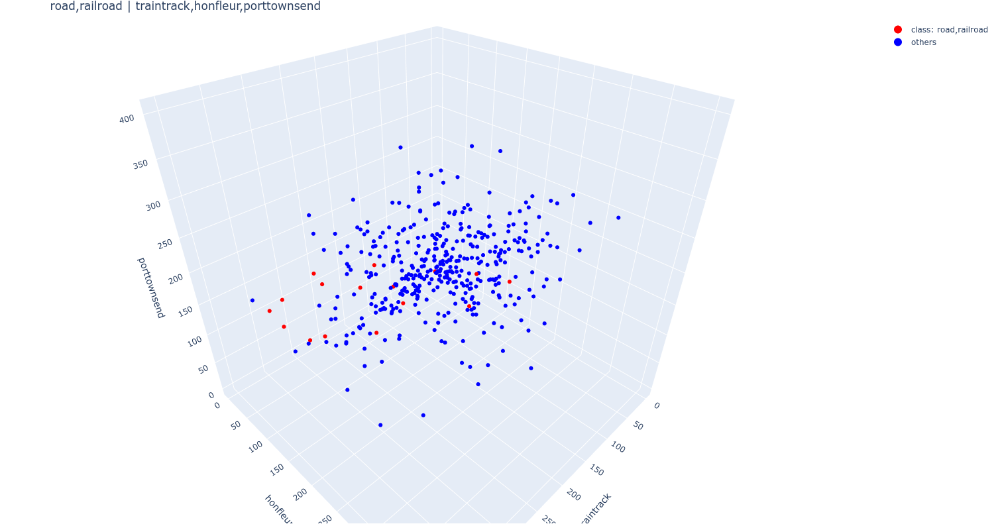

In [17]:
with ThreeDFigure(name=catnames[1]+" | "+",".join(inputs.columns)) as fig:
    fig.fig.update_layout(scene = dict(xaxis_title=inputs.columns[0], yaxis_title=inputs.columns[1], zaxis_title=inputs.columns[2]))
    fig.add_markers(pos_inpt, color="red", name=f"class: {catnames[1]}", custom_data=pos_custom_data)
    fig.add_markers(neg_inpt, color="blue", name="others", custom_data=neg_custom_data)
    fig.show()

In [18]:
# idea comes from https://scikit-learn.org/stable/auto_examples/tree/plot_iris_dtc.html
plot_step = 10
minmax = list(zip(list(inputs.min()), list(inputs.max())))
xxyyzz = np.meshgrid(*[np.arange(i[0], i[1], plot_step) for i in minmax])
index_nrs = [list(inputcols).index(i) for i in inputs.columns]

tmp = [np.zeros_like(xxyyzz[0].ravel()) for _ in range(len(inputcols))]
for num, elem in enumerate(index_nrs):
    tmp[elem] = xxyyzz[num].ravel()

In [19]:
boundary_inputs = np.column_stack(tmp)
boundary_targets = clf.predict(boundary_inputs) #.reshape(xxyyzz[0].shape)
boundary_inputs = boundary_inputs[:,index_nrs]

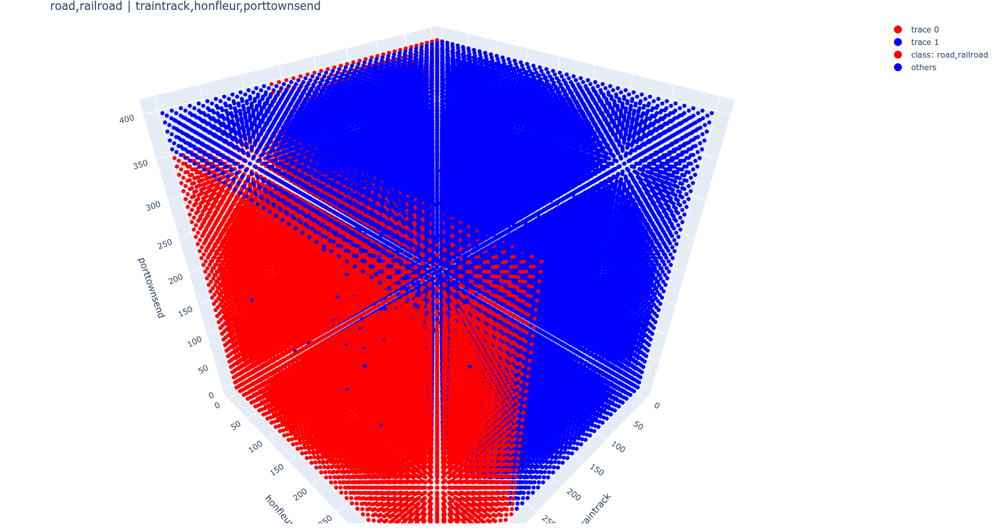

In [20]:
with ThreeDFigure(name=catnames[1]+" | "+",".join(inputs.columns)) as fig:
    fig.fig.update_layout(scene = dict(xaxis_title=inputs.columns[0], yaxis_title=inputs.columns[1], zaxis_title=inputs.columns[2]))
    fig.add_markers(boundary_inputs[np.where(boundary_targets)], color="red")
    fig.add_markers(boundary_inputs[np.where(1-boundary_targets)], color="blue")
    fig.add_markers(pos_inpt, color="red", name=f"class: {catnames[1]}", custom_data=pos_custom_data)
    fig.add_markers(neg_inpt, color="blue", name="others", custom_data=neg_custom_data)
    fig.show()

## Uff, let's use contours

In [21]:
decision_borders = {i[0]: (0, i[1], i[1]+0.001, inputs.max()[n]) for n,i in enumerate(get_decisions(inputs, clf, catnames, axnames))}
decision_borders

{'traintrack,smokestack,narrowgauge': (0, 272.5, 272.501, 403),
 'honfleur,lifeboat,pesce': (0, 9.5, 9.501, 403),
 'porttownsend,coastguard,montereybay': (0, 352.5, 352.501, 403)}

In [22]:
xxyyzz = np.meshgrid(*decision_borders.values())
index_nrs = [list(inputcols).index(i) for i in inputs.columns]

tmp = [np.zeros_like(xxyyzz[0].ravel()) for _ in range(len(inputcols))]
for num, elem in enumerate(index_nrs):
    tmp[elem] = xxyyzz[num].ravel()

In [23]:
boundary_inputs = np.column_stack(tmp)
boundary_targets = clf.predict(boundary_inputs) #.reshape(xxyyzz[0].shape)
boundary_inputs = boundary_inputs[:,index_nrs].round()

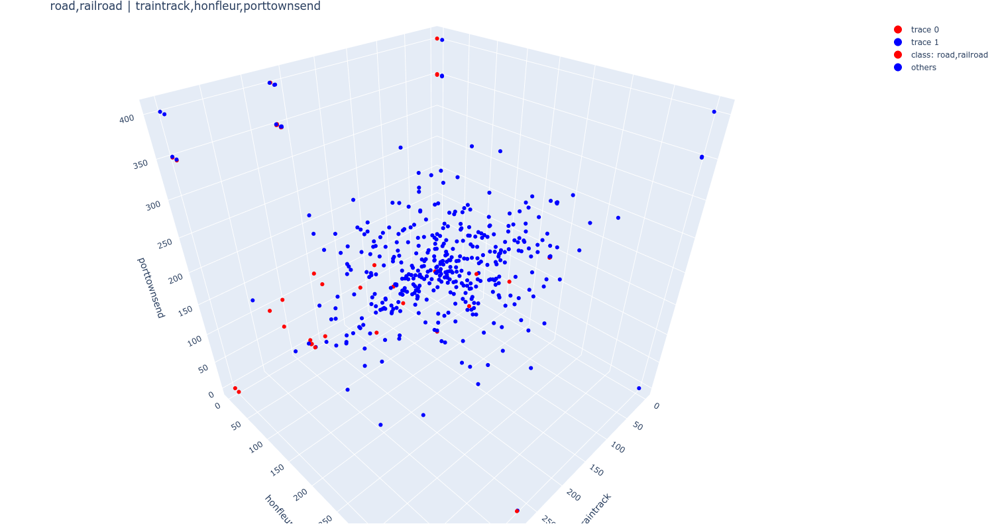

In [24]:
with ThreeDFigure(name=catnames[1]+" | "+",".join(inputs.columns)) as fig:
    fig.fig.update_layout(scene = dict(xaxis_title=inputs.columns[0], yaxis_title=inputs.columns[1], zaxis_title=inputs.columns[2]))
    fig.add_markers(boundary_inputs[np.where(boundary_targets)], color="red")
    fig.add_markers(boundary_inputs[np.where(1-boundary_targets)], color="blue")
    fig.add_markers(pos_inpt, color="red", name=f"class: {catnames[1]}", custom_data=pos_custom_data)
    fig.add_markers(neg_inpt, color="blue", name="others", custom_data=neg_custom_data)
    fig.show()

In [25]:
# in theory https://plotly.com/python/3d-mesh/, but the problem is really not trivial so nope, not doing that.

In [26]:
from itertools import product
borders = [((0, i[1]-1), (i[1]+1, inputs.max()[n])) for n,i in enumerate(get_decisions(inputs, clf, catnames, axnames))]
quaders = list(product(*borders))
quaders

[((0, 271.5), (0, 8.5), (0, 351.5)),
 ((0, 271.5), (0, 8.5), (353.5, 403)),
 ((0, 271.5), (10.5, 403), (0, 351.5)),
 ((0, 271.5), (10.5, 403), (353.5, 403)),
 ((273.5, 403), (0, 8.5), (0, 351.5)),
 ((273.5, 403), (0, 8.5), (353.5, 403)),
 ((273.5, 403), (10.5, 403), (0, 351.5)),
 ((273.5, 403), (10.5, 403), (353.5, 403))]

In [27]:
index_nrs = [list(inputcols).index(i) for i in inputs.columns]
tmp = [np.zeros(len(quaders)) for _ in range(len(inputcols))]
for num, elem in enumerate(index_nrs):
    tmp[elem] = np.array([[i[0] for i in j] for j in quaders]).T[num]
boundary_inputs = np.column_stack(tmp)
boundary_targets = clf.predict(boundary_inputs)

In [28]:
def get_coords(quad):
    coords = list(zip(*list(product(*quad))))
    arg = np.array(list(zip(*coords))).T
    arg = arg.T[[0,2,6,4,1,3,7,5]].T #this is the order from "Mesh Cube" from docs: https://plotly.com/python/3d-mesh/
    return [list(i) for i in arg]

In [29]:
for quad, target in zip(quaders, boundary_targets):
    if target == 1:
        coords = list(zip(*list(product(*quad))))
        arg = np.array(list(zip(*coords))).T
        arg = arg.T[[0,2,6,4,1,3,7,5]].T #this is the order from "Mesh Cube" from docs: https://plotly.com/python/3d-mesh/
        coords = [list(i) for i in arg]
        break

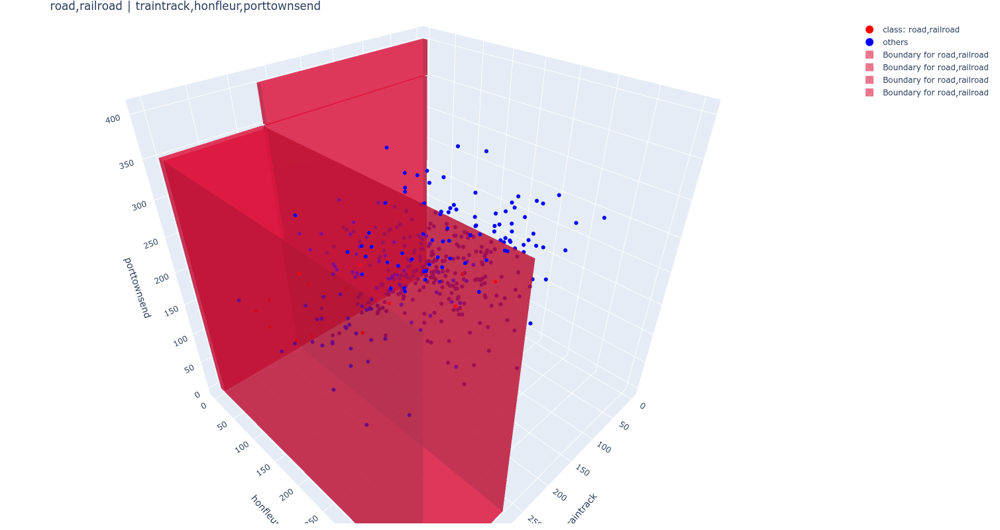

In [30]:
with ThreeDFigure(name=catnames[1]+" | "+",".join(inputs.columns)) as fig:
    fig.fig.update_layout(scene = dict(xaxis_title=inputs.columns[0], yaxis_title=inputs.columns[1], zaxis_title=inputs.columns[2]))
    fig.add_markers(pos_inpt, color="red", name=f"class: {catnames[1]}", custom_data=pos_custom_data)
    fig.add_markers(neg_inpt, color="blue", name="others", custom_data=neg_custom_data)
    for quad, target in zip(quaders, boundary_targets):
        if target == 1:
            fig.add_quader(get_coords(quad), name=f"Boundary for {catnames[1]}")
    fig.show()

In [31]:
with ThreeDFigure(name=catnames[1]+" | "+",".join(inputs.columns)) as fig:
    fig.fig.update_layout(scene = dict(xaxis_title=inputs.columns[0], yaxis_title=inputs.columns[1], zaxis_title=inputs.columns[2]))
    fig.add_markers(pos_inpt, color="red", name=f"class: {catnames[1]}", custom_data=pos_custom_data)
    fig.add_markers(neg_inpt, color="blue", name="others", custom_data=neg_custom_data)
    fig.fig.add_trace(
        go.Mesh3d(
                # 8 vertices of a cube
                x=coords[0],
                y=coords[1],
                z=coords[2],

                i = [7, 0, 0, 0, 4, 4, 6, 6, 4, 0, 3, 2],
                j = [3, 4, 1, 2, 5, 6, 5, 2, 0, 1, 6, 3],
                k = [0, 7, 2, 3, 6, 7, 1, 1, 5, 5, 7, 6],
                opacity=0.6,
                color='#DC143C',
                flatshading = True,
            )                    
    )
    fig.show()

NameError: name 'go' is not defined